# <center>Exploratory Data Analysis- ANZ Bank<center>

####  This is a virtual experience program dataset provided by ANZ Bank of Australia and hosted by forage.

#### Notebook by- AKSHAY G BHAT

#### Goal: Draw insights from the data about customers purchase behaviour,transactions,location and other attributes. Visualize those insights to get clear view.

#### Dataset:The data set contains 12,043 observations with 23 variables.
#####  <center>Let's get started!<center>

## PART 1- DATA LOADING AND PREPROCESSING

In [499]:
#IMPORTING DEPENDENCIES

import pandas as pd
import numpy as np
#Visualization
from matplotlib import pyplot as plt
%matplotlib inline
import seaborn as sns
plt.style.use('seaborn-whitegrid')
import plotly.express as px
import folium
#Pre processing
import missingno as msno 
#Warnings
import warnings
warnings.filterwarnings('ignore')
import plotly.offline as pyo
# Set notebook mode to work in offline
pyo.init_notebook_mode()
f = go.FigureWidget()


In [500]:
#As our data is in the form of an excel file we will use read_excel to load the data
data=pd.read_excel("ANZ synthesised transaction dataset.xlsx")

In [501]:
#Shape of the data
data.shape

(12043, 23)

In [502]:
#Analyzing the first five rows
data.head()

,status,card_present_flag,bpay_biller_code,account,currency,long_lat,txn_description,merchant_id,merchant_code,first_name,...,age,merchant_suburb,merchant_state,extraction,amount,transaction_id,country,customer_id,merchant_long_lat,movement
0,authorized,1.0,NaN,ACC-1598451071,AUD,153.41 -27.95,POS,81c48296-73be-44a7-befa-d053f48ce7cd,NaN,Diana,...,26,Ashmore,QLD,2018-08-01T01:01:15.000+0000,16.25,a623070bfead4541a6b0fff8a09e706c,Australia,CUS-2487424745,153.38 -27.99,debit
1,authorized,0.0,NaN,ACC-1598451071,AUD,153.41 -27.95,SALES-POS,830a451c-316e-4a6a-bf25-e37caedca49e,NaN,Diana,...,26,Sydney,NSW,2018-08-01T01:13:45.000+0000,14.19,13270a2a902145da9db4c951e04b51b9,Australia,CUS-2487424745,151.21 -33.87,debit
2,authorized,1.0,NaN,ACC-1222300524,AUD,151.23 -33.94,POS,835c231d-8cdf-4e96-859d-e9d571760cf0,NaN,Michael,...,38,Sydney,NSW,2018-08-01T01:26:15.000+0000,6.42,feb79e7ecd7048a5a36ec889d1a94270,Australia,CUS-2142601169,151.21 -33.87,debit
3,authorized,1.0,NaN,ACC-1037050564,AUD,153.10 -27.66,SALES-POS,48514682-c78a-4a88-b0da-2d6302e64673,NaN,Rhonda,...,40,Buderim,QLD,2018-08-01T01:38:45.000+0000,40.90,2698170da3704fd981b15e64a006079e,Australia,CUS-1614226872,153.05 -26.68,debit
4,authorized,1.0,NaN,ACC-1598451071,AUD,153.41 -27.95,SALES-POS,b4e02c10-0852-4273-b8fd-7b3395e32eb0,NaN,Diana,...,26,Mermaid Beach,QLD,2018-08-01T01:51:15.000+0000,3.25,329adf79878c4cf0aeb4188b4691c266,Australia,CUS-2487424745,153.44 -28.06,debit


In [503]:
#dataset columns
data.columns

Index(['status', 'card_present_flag', 'bpay_biller_code', 'account',
       'currency', 'long_lat', 'txn_description', 'merchant_id',
       'merchant_code', 'first_name', 'balance', 'date', 'gender', 'age',
       'merchant_suburb', 'merchant_state', 'extraction', 'amount',
       'transaction_id', 'country', 'customer_id', 'merchant_long_lat',
       'movement'],
      dtype='object')

The dataset contains transactional information and customer information like merchant_id, gender,age, state, country, transaction_id, customer_id etc.

<AxesSubplot:>

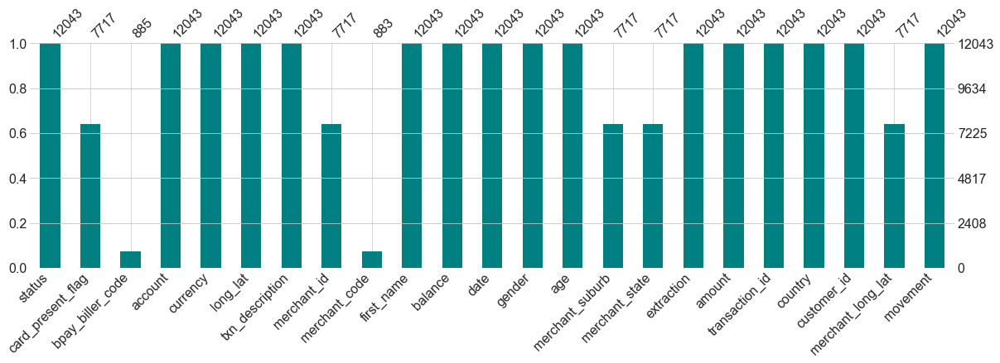

In [504]:
#Check for missing values in the dataset
msno.bar(data, figsize=(20,5),color='Teal')

Looks like the dataset contains decent amount of missing values. 

In [505]:
#Lets check which columns have missing data with the count
data.isnull().sum()

status                   0
card_present_flag     4326
bpay_biller_code     11158
account                  0
currency                 0
long_lat                 0
txn_description          0
merchant_id           4326
merchant_code        11160
first_name               0
balance                  0
date                     0
gender                   0
age                      0
merchant_suburb       4326
merchant_state        4326
extraction               0
amount                   0
transaction_id           0
country                  0
customer_id              0
merchant_long_lat     4326
movement                 0
dtype: int64

In [506]:
# Let’s see what percentage they take up in the whole dataset.
data.isnull().mean() * 100

status                0.000000
card_present_flag    35.921282
bpay_biller_code     92.651333
account               0.000000
currency              0.000000
long_lat              0.000000
txn_description       0.000000
merchant_id          35.921282
merchant_code        92.667940
first_name            0.000000
balance               0.000000
date                  0.000000
gender                0.000000
age                   0.000000
merchant_suburb      35.921282
merchant_state       35.921282
extraction            0.000000
amount                0.000000
transaction_id        0.000000
country               0.000000
customer_id           0.000000
merchant_long_lat    35.921282
movement              0.000000
dtype: float64

In [507]:
#Checking duplicate records
data.duplicated().sum()

0

Good! The dataset doesn't contain any duplicated records.

In [508]:
# Checking unique values in each of the columns.
data.nunique()

status                   2
card_present_flag        2
bpay_biller_code         3
account                100
currency                 1
long_lat               100
txn_description          6
merchant_id           5725
merchant_code            1
first_name              80
balance              12006
date                    91
gender                   2
age                     33
merchant_suburb       1609
merchant_state           8
extraction            9442
amount                4457
transaction_id       12043
country                  1
customer_id            100
merchant_long_lat     2703
movement                 2
dtype: int64

### Dealing with missing data

* I will drop the columns having 40% or more missing values.
* As bpay_biller_code and merchant_code have 90% null values it's of no use. 

In [509]:
data.drop('bpay_biller_code',axis = 1,inplace = True)
data.drop('merchant_code',axis = 1,inplace = True)

merchant_suburb and merchant_state can't be filled.

## PART 2- EXPLORATORY DATA ANALYSIS

Let's analyze some of the features to find out it's importance.

#### 1 -Status 

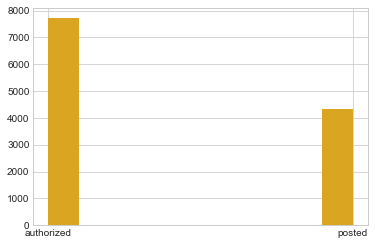

In [510]:
data['status'].hist(color='goldenrod')
plt.show()

#### 2 - card_present_flag

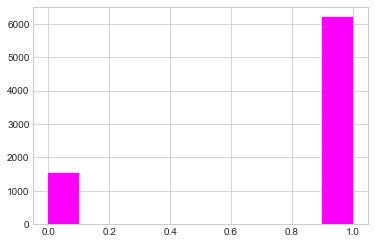

In [511]:
data['card_present_flag'].hist(color='magenta')
plt.show()

* Shows if the card was used for the transaction or not

### 3- Account Number
Let's drop this as it provides no info


In [512]:
data.drop('account',axis = 1,inplace = True)

### 4- Currency
We have only AUD in our dataset and we can drop it

In [513]:
data.drop('currency',axis = 1,inplace = True)

### 5- txn_description

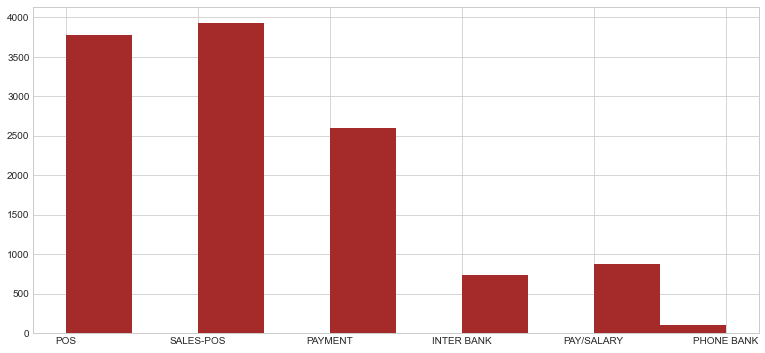

In [514]:
data['txn_description'].hist(figsize=(13,6),color='brown')
plt.show()

### 6- merchant_id 

This feature is of no use to us and we can drop them.

In [515]:
data.drop('merchant_id',axis = 1,inplace = True)

### 7- Extraction, transaction_id and first name

These features do not mean much to us. Let's drop them.

In [516]:
data.drop('extraction',axis = 1,inplace = True)
data.drop('transaction_id',axis = 1,inplace = True)
data.drop('first_name',axis = 1,inplace = True)

In [517]:
data.columns

Index(['status', 'card_present_flag', 'long_lat', 'txn_description', 'balance',
       'date', 'gender', 'age', 'merchant_suburb', 'merchant_state', 'amount',
       'country', 'customer_id', 'merchant_long_lat', 'movement'],
      dtype='object')

### FEATURE EXTRACTION

* DATE TIME FEATURES 

In [518]:
# Generating datetime features to carry in-depth analysis

data['Day']=pd.to_datetime(data['date']).dt.day #Generate the day
data['year']=pd.to_datetime(data['date']).dt.year # Generate the year
data['month']=pd.to_datetime(data['date']).dt.month #Generate the month
data['Month_name']=pd.to_datetime(data['date']).dt.strftime('%B')  #Generate the Monthname
data['Weekday']=pd.to_datetime(data['date']).dt.strftime('%A')  #Generate the Weekday
data['Week_num']=pd.to_datetime(data['date']).dt.strftime('%W') # Generate the week number
data['Date_categ']=np.where(data['Day']<16,"First Half","Second Half") #Categorize the month into first half and second half

In [519]:
data.head(2)

,status,card_present_flag,long_lat,txn_description,balance,date,gender,age,merchant_suburb,merchant_state,...,customer_id,merchant_long_lat,movement,Day,year,month,Month_name,Weekday,Week_num,Date_categ
0,authorized,1.0,153.41 -27.95,POS,35.39,2018-08-01,F,26,Ashmore,QLD,...,CUS-2487424745,153.38 -27.99,debit,1,2018,8,August,Wednesday,31,First Half
1,authorized,0.0,153.41 -27.95,SALES-POS,21.20,2018-08-01,F,26,Sydney,NSW,...,CUS-2487424745,151.21 -33.87,debit,1,2018,8,August,Wednesday,31,First Half


Let's drop the date column.

In [520]:
data.drop('date',axis = 1,inplace = True)

* AGE CATEGORY

In [521]:
# Generating Age related features

data['Age_Category']=np.where(data['age']<18,'<18',np.where((data['age']>17)&(data['age']<=30),'18-30',
np.where((data['age']>30)&(data['age']<=40),'31-40',np.where(data['age']>50,'50+',
np.where((data['age']>40)&(data['age']<=50),'41-50',"Not Specified")))))


* LATITUDE AND LONGITUDE

In [522]:
# Create lists for the loop results to be placed
c_lat = []
c_lon = []
m_lat = []
m_lon = []

# For each row in a varible long_lat,
for row in data['long_lat']:
    try:
        # Split the row by space and append
        # everything before the comma to c_lon
        c_lon.append(row.split(' ')[0])
        # Split the row by space and append
        # everything after the comma to c_lat
        c_lat.append(row.split(' ')[1])
    # But if you get an error
    except:
        # append a missing value to lon
        c_lon.append(np.NaN)
        # append a missing value to lat
        c_lat.append(np.NaN)


        
# For each row in a varible merchant_long_lat,
for row in data['merchant_long_lat']:
    try:
        # Split the row by space and append
        # everything before the comma to m_lon
        m_lon.append(row.split(' ')[0])
        # Split the row by space and append
        # everything after the comma to m_lat
        m_lat.append(row.split(' ')[1])
    # But if you get an error
    except:
        # append a missing value to lon
        m_lon.append(np.NaN)
        # append a missing value to lat
        m_lat.append(np.NaN)

#Adding the created lists to our data frame
data['c_lon'] = pd.DataFrame(c_lon).astype('float')
data['c_lat'] = pd.DataFrame(c_lat).astype('float')
data['m_lon'] = pd.DataFrame(m_lon).astype('float')
data['m_lat'] = pd.DataFrame(m_lat).astype('float')

In [523]:
#Drop long_lat and merchant_long_lat.
data.drop('long_lat',axis = 1,inplace = True)
data.drop('merchant_long_lat',axis = 1,inplace = True)

In [524]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12043 entries, 0 to 12042
Data columns (total 24 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   status             12043 non-null  object 
 1   card_present_flag  7717 non-null   float64
 2   txn_description    12043 non-null  object 
 3   balance            12043 non-null  float64
 4   gender             12043 non-null  object 
 5   age                12043 non-null  int64  
 6   merchant_suburb    7717 non-null   object 
 7   merchant_state     7717 non-null   object 
 8   amount             12043 non-null  float64
 9   country            12043 non-null  object 
 10  customer_id        12043 non-null  object 
 11  movement           12043 non-null  object 
 12  Day                12043 non-null  int64  
 13  year               12043 non-null  int64  
 14  month              12043 non-null  int64  
 15  Month_name         12043 non-null  object 
 16  Weekday            120

## DATA VISUALIZATION

### 1-  CUSTOMER LOCATION ANALYSIS

I am going to use folium to map the customer base.

In [525]:
def get_center_latlong(data):
    # get the center of my map for plotting
    centerlat = (data['c_lat'].max() + data['c_lat'].min()) / 2
    centerlong = (data['c_lon'].max() + data['c_lon'].min()) / 2
    return centerlat, centerlong

In [526]:
#Make a Simple Folium Map
# grab the center of our map using our cool function
center = get_center_latlong(data)

# create a new map object
m = folium.Map(location=center, zoom_start=0.3,tiles="OpenStreetMap")

In [527]:
# go through each location in set, make circle, and add to map.
for i in range(len(data)):
    folium.Circle(
        location=[data.iloc[i]['c_lat'], data.iloc[i]['c_lon']],
        radius=10,
    ).add_to(m)
m.save('Customer_location.html')

#The map file is attached with this notebook and not displayed here as it is pretty heavy in terms of size

### Observation:
* Most of the customer base is in melbourne and sydney.
* We have one outlier co-ordinate which is present out of Australia.


### 2-  MERCHANT LOCATION ANALYSIS

In [528]:
# I will use colormap to map the merchant coordinates with the amount of transaction
import branca.colormap as cm

In [529]:
# Before plotting we need to drop the Nan values in the merchant co-ordinates
data1=data[['amount','m_lat','m_lon']]

data1=data1.dropna(subset=['m_lat'])

data1=data1.dropna(subset=['m_lon'])


In [530]:
# create a LinearColorMap and assign colors, vmin, and vmax
colormap = cm.LinearColormap(colors=['green', 'yellow', 'red'], vmin=0.1, vmax=60)

# create our map again.  This time I am using a different tileset for a new look
m = folium.Map(location=center, zoom_start=0.3, tiles='Stamen Toner')

# Same as before... go through each home in set, make circle, and add to map.
# This time we add a color using price and the colormap object
for i in range(len(data1)):
    folium.Circle(
        location=[data1.iloc[i]['m_lat'], data1.iloc[i]['m_lon']],
        radius=10,
        fill=True,
        color=colormap(data1.iloc[i]['amount']),
        fill_opacity=0.2
    ).add_to(m)

# the following line adds the scale directly to our map
m.add_child(colormap)
m.save('merchant_location.html')

#The map file is attached with this notebook and not displayed here as it is pretty heavy in terms of size

### Observation: 
* Most of the transaction amount are under 60 AUD.

### 3- STATE WISE TRANSACTION ANALYSIS

In [531]:
state_names = data['merchant_state'].value_counts().keys()
state_trans = data['merchant_state'].value_counts().tolist()

state_df = pd.DataFrame()
state_df['State'] = state_names
state_df['Transactions'] = state_trans


In [532]:
state_df

,State,Transactions
0,NSW,2169
1,VIC,2131
2,QLD,1556
3,WA,1100
4,SA,415
5,NT,205
6,ACT,73
7,TAS,68


In [533]:
import plotly.graph_objects as go
fig = go.Figure(go.Bar(
    x= state_df['State'], 
    y= state_df['Transactions'],  
    text=state_df['Transactions'],
    textposition='outside',
    marker_color=state_df['Transactions']
))

fig.update_xaxes(showline=True, linewidth=2, linecolor='black', mirror=True)
fig.update_yaxes(showline=True, linewidth=2, linecolor='black', mirror=True)
fig.update_layout(title_text='Transaction count by State',xaxis_title='States',
                 yaxis_title='Total number of Transactions', title_x=0.5)

fig.show()


### Observation:
* New south wales and Victoria had majority of the transactions

### 4 - TOP 20 SUBURBS IN TERMS OF TRANSACTIONS

In [534]:
suburb_names = data['merchant_suburb'].value_counts().keys()
suburb_trans = data['merchant_suburb'].value_counts().tolist()

suburb_df = pd.DataFrame()
suburb_df['Suburb'] = suburb_names
suburb_df['Transactions'] = suburb_trans

In [535]:
fig = go.Figure(go.Bar(
    x= suburb_df['Suburb'][:20], 
    y= suburb_df['Transactions'][:20],  
    text=suburb_df['Transactions'][:20],
    textposition='outside',
    marker_color=suburb_df['Transactions'][:20]
))

fig.update_xaxes(showline=True, linewidth=2, linecolor='black', mirror=True)
fig.update_yaxes(showline=True, linewidth=2, linecolor='black', mirror=True)
fig.update_layout(title_text='Top 20 Suburbs based on transactions',xaxis_title='Suburbs',
                 yaxis_title='Total number of Transactions', title_x=0.5)

fig.show()

### Observation:
* As expected Melbourne and Sydney have experienced majority the transactions

### 4 - AGE WISE ANALYSIS

In [546]:
#Age category analysis
fig = px.histogram(data, x="Age_Category", nbins=20,color='Age_Category')
go.FigureWidget(fig)

FigureWidget({
    'data': [{'alignmentgroup': 'True',
              'bingroup': 'x',
              'hovertemp…

### Observation: 
* Customers of Age category 18-30 have done majority of the transactions.
* Transaction count drops off with increase in age.

### 5- MONTH WISE ANALYSIS

In [537]:
month = data['Month_name'].value_counts().keys()
count = data['Month_name'].value_counts().tolist()

month_df = pd.DataFrame()
month_df['Month'] = month
month_df['Transactions'] = count


In [538]:
fig = go.Figure(go.Bar(
    x=month_df['Month'],y=month_df['Transactions'],
    marker={'color': month_df['Transactions'], 
    'colorscale': 'magenta'},  
    text=month_df['Transactions'],
    textposition = "outside"))
fig.update_layout(title_text='Transactions By Month ',xaxis_title="Months",yaxis_title="Number of Transactions",title_x=0.5)
fig.show()


### Observation:
* October recorded the highest number of transactions with a count of 4087
* The average number of transactions for the 3 months is around 4000.

### 6- DAY WISE TRANSACTION COUNT

Text(0.5, 0, 'Day')

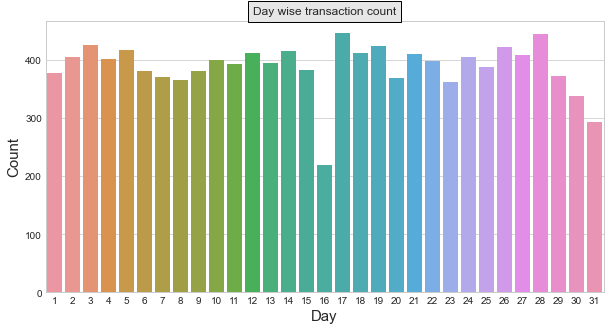

In [539]:
# visualize day wise transaction count

plt.figure(figsize=(10,5))
sns.countplot(x='Day' , data=data)
plt.title("Day wise transaction count",bbox={'facecolor':'0.9', 'pad':5})
plt.ylabel("Count",fontsize=15)
plt.xlabel("Day",fontsize=15)

* Most of the days have 300+ transactions

### 7- MONTH CATEGORY ( First half or Second half)

In [540]:
fig = px.pie(data, names='Date_categ', color_discrete_sequence=px.colors.sequential.Aggrnyl,hole=.4)
go.FigureWidget(fig)

FigureWidget({
    'data': [{'domain': {'x': [0.0, 1.0], 'y': [0.0, 1.0]},
              'hole': 0.4,
        …

### Observation:
* Transactions are done evenly over the first and second half of the months.

### 8 - MONTH WISE TRANSACTION AMOUNT

Text(0.5, 0, 'Month')

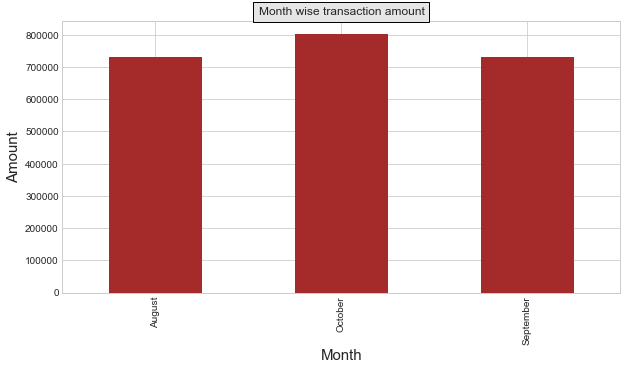

In [541]:
# visualize month wise transaction amount
plt.figure(figsize = (10,5))
data.groupby('Month_name').amount.sum().plot(kind='bar',color="Brown")
plt.title("Month wise transaction amount",bbox={'facecolor':'0.9', 'pad':5})
plt.ylabel("Amount",fontsize=15)
plt.xlabel("Month",fontsize=15)

* October had a transaction value of 800000 AUD.

### 9 - GENDER v/s TRANSACTIONS

In [542]:
import altair as alt
gen_mon=data[['gender','Month_name']].groupby(['gender','Month_name']).size().to_frame().reset_index().rename(columns={0:'count'})

alt.Chart(gen_mon).mark_bar().encode(
    x='Month_name',
    y='count',
    color='Month_name',
    column='gender',
    tooltip=['Month_name','gender','count']
).properties(height=400,width=250,title="GENDER v/s TRANSACTIONS MONTH WISE")


alt.Chart(...)

### 10- AGE v/s BALANCE 

In [543]:
alt.data_transformers.disable_max_rows()
alt.Chart(data).mark_circle().encode(
    alt.X('Age_Category', title="AGE CATEGORY",scale=alt.Scale(zero=False)),
    alt.Y('balance',title="BALANCE", scale=alt.Scale(zero=False, padding=1)),
    color='Age_Category',
    size='balance',
    tooltip=[alt.Tooltip('Age_Category'),
            alt.Tooltip('balance')]
).properties(width=500,height=400,title="AGE v/s BALANCE")


alt.Chart(...)

### OBSERVATION:
* It can be seen that the elder people tend to have higher balance in their account
* The age group of 41-50 has the highest balance in their account


### 11- TYPE OF TRANSACTION v/s AMOUNT OF TRANSACTION

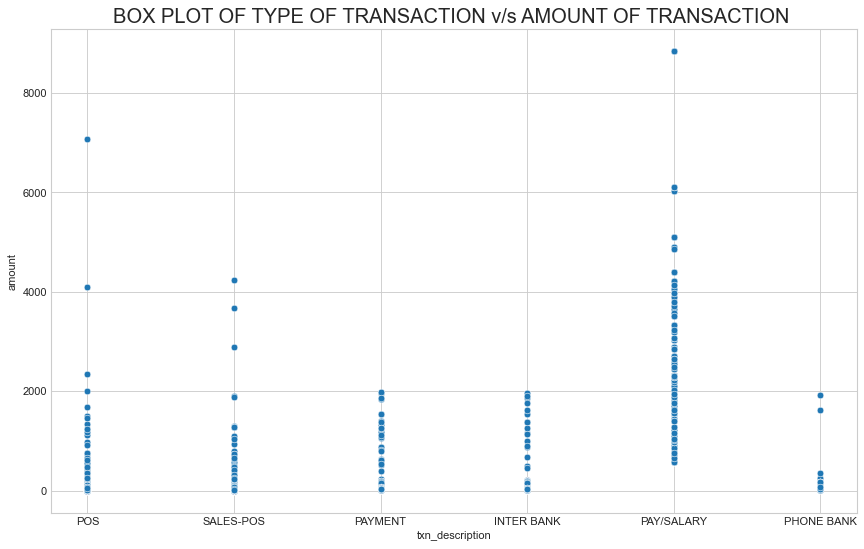

In [544]:
plt.figure(figsize=(13,8), dpi= 80)
sns.scatterplot(x="txn_description",y="amount",data=data)

# Decoration
plt.title('BOX PLOT OF TYPE OF TRANSACTION v/s AMOUNT OF TRANSACTION ', fontsize=18)
plt.show()

### OBSERVATION:
* Most of the transactions were related to salary

### 12 - CARD USAGE FOR TRANSACTIONS

In [545]:
#Dropping null records
data=data.dropna(subset=['card_present_flag'])

fig = px.pie(data, names='card_present_flag', color_discrete_sequence=px.colors.sequential.Aggrnyl,hole=.4)
fig.show()

* Card is used for most of the transactions

### <CENTER>THANK YOU!